In [1]:
using Flux, Statistics
using Flux.Data: DataLoader
using Flux: onehotbatch, onecold, @epochs
using Flux.Losses: logitcrossentropy
using Base: @kwdef
using MLDatasets
using Plots

In [2]:
include("src/network.jl")
include("src/vsa.jl")
include("src/spiking.jl")

zero_nans (generic function with 1 method)

In [87]:
using Flux: nfan, truncated_normal

In [88]:
function variance_scaling(shape::Tuple{Vararg{<:Int}}, mode::String = "fan_in", scale::Real = 1.0)
    fan_in, fan_out = nfan(shape)
    if mode == "fan_in"
        scale /= max(1.0, fan_in)
    elseif mode == "fan_out"
        scale /= max(1.0, fan_out)
    else
        scale /= max(1.0, (fan_in + fan_out) / 2.0)
    end

    stddev = sqrt(scale) / 0.87962566103423978
    return truncated_normal(shape..., mean = 0.0, std = stddev)
end

variance_scaling (generic function with 3 methods)

In [89]:
variance_scaling((10, 20))

10×20 Matrix{Float32}:
 -0.222824    -0.385706    0.385407   …  -0.200227    0.480972   -0.190162
  0.0660233   -0.0859572   0.184036      -0.28728    -0.0407521  -0.0238364
  0.302764     0.246595    0.573159      -0.137699    0.079517    0.789873
 -0.36242      0.236188    0.0900513      0.0941618  -0.31619    -0.363727
  0.224572     0.145875   -0.0736809      0.354588   -0.179973   -0.443589
  0.436602    -0.182738    0.0851416  …  -0.095842    0.172069    0.113953
  0.0740411   -0.138928    0.454296      -0.0584158  -0.297195    0.20968
  0.238701     0.153292   -0.193224       0.225693    0.0423103  -0.378732
 -0.00187901  -0.347942   -0.0625731     -0.0873821   0.0349292  -0.593742
  0.410108    -0.0887411  -0.0920381      0.068676    0.129169    0.2316

In [37]:
function bundle_project(x::SpikeTrain, w::AbstractMatrix, b::AbstractVecOrMat, tspan::Tuple{<:Real, <:Real}, spk_args::SpikingArgs; return_solution::Bool=false)
    #set up functions to define the neuron's differential equations
    k = (spk_args.leakage + 1im * spk_args.angular_frequency)
    output_shape = (x.shape[1], size(w, 2))
    u0 = zeros(ComplexF32, output_shape)
    dzdt(u, p, t) = k .* u + spike_current(x, t, spk_args) * w #.+ bias_current(b, t, x.offset, spk_args)'
    #solve the ODE over the given time span
    prob = ODEProblem(dzdt, u0, tspan)
    sol = solve(prob, Heun(), adaptive=false, dt=spk_args.dt)
    #option for early exit (mostly for debug)
    if return_solution return sol end
    #convert the full solution (potentials) to spikes
    indices, times = find_spikes_rf(sol, spk_args)
    #construct the spike train and call for the next layer
    train = SpikeTrain(indices, times, output_shape, x.offset + spk_args.t_period / 4.0)
    next_call = SpikingCall(train, spk_args, tspan)
    return next_call
end

bundle_project (generic function with 2 methods)

In [38]:
model = Chain(PhasorDense(1024 => 256), )

Chain(
  PhasorDense(1024 => 256),             # 262_400 parameters
) 

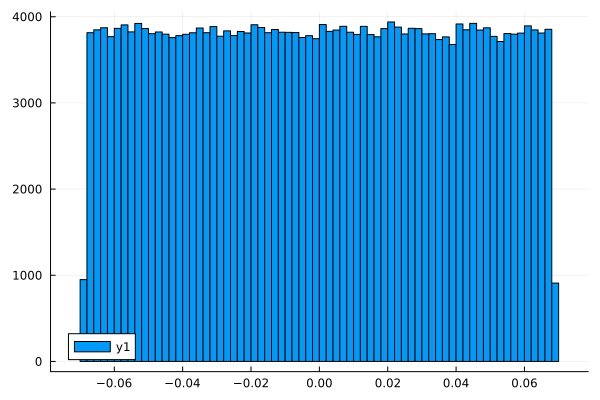

In [83]:
histogram(model[1].weight |> vec)

In [39]:
x = random_symbols((100, 1024));

100×1024 Matrix{Float64}:
 -0.397548    0.424329    0.874777   …  -0.579405   0.48387     0.272688
 -0.671339   -0.542607    0.167423       0.990945   0.64865    -0.374175
  0.598148   -0.139048    0.184029       0.206581   0.85808     0.641903
 -0.536338    0.782086   -0.953816      -0.195788  -0.0382245   0.350329
  0.62519    -0.0572491  -0.968416      -0.360753  -0.805537   -0.427127
 -0.799523    0.962408   -0.558062   …   0.337777   0.425015   -0.12704
 -0.881083   -0.959331    0.831055      -0.605605   0.417681   -0.713951
 -0.434497   -0.0462321  -0.683159       0.752223  -0.332622   -0.17477
 -0.728839   -0.897255    0.070588       0.538063  -0.286324   -0.482051
  0.338181   -0.993889    0.442898       0.443298   0.4759     -0.804152
  0.663723    0.925395   -0.519266   …  -0.738926   0.387193    0.270454
  0.754319    0.684068   -0.157787      -0.605936   0.409628    0.681214
 -0.914276   -0.611209   -0.227521      -0.804626   0.621633   -0.0416179
  ⋮                       

In [40]:
x |> size

(100, 1024)

In [41]:
model[1].weight

256×1024 Matrix{Float32}:
  0.0629737    -0.0493148  -0.0569886   …   0.0662834   -0.0428462
  0.0604452    -0.0249922  -0.00244187      0.0340007   -0.0166023
 -0.0152673    -0.0290583   0.0486031       0.0586022    0.0355607
 -0.0154048    -0.0186201   0.0590541       0.0133646    0.0499595
 -0.064678      0.0531333  -0.0559001      -0.0311388   -0.0397035
 -0.0432898     0.0550552   0.0568183   …   0.0607142   -0.0142927
  0.043618     -0.0362056   0.0147878      -0.0158421   -0.0294581
  0.05369       0.062531    0.0175706      -0.0251162   -0.0645643
 -0.068068     -0.0556253   0.0166164       0.00890305  -0.045432
  0.0428256     0.0337759  -0.0300597      -0.0358313   -0.0625922
 -0.01783      -0.066118    0.0587555   …   0.0679203    0.0525721
  0.0371374    -0.0392171   0.0525166       0.0402376    0.0285711
  0.000791971   0.0115409  -0.0142871       0.0128302   -0.0109214
  ⋮                                     ⋱               
 -0.0320236     0.0410508   0.00042329      0.0

In [42]:
model2 = Chain(PhasorDense(model[1].weight, zero(model[1].bias)))

Chain(
  PhasorDense(1024 => 256),             # 262_400 parameters
) 

In [43]:
y = model(x)

100×256 Matrix{Float64}:
  0.377447    0.174003    0.299032    …  -0.169463   -0.269169    0.295795
 -0.0391353   0.332213   -0.163001       -0.0470041   0.0389367   0.32777
  0.0202896   0.237536   -0.545696       -0.109129    0.678962    0.0323055
  0.0645341  -0.675716    0.189437       -0.17789     0.153808   -0.0987132
 -0.984669   -0.0162201  -0.50749         0.0302303   0.552037   -0.102945
  0.0336519   0.139374   -0.212428    …   0.0392322  -0.175258    0.0515589
 -0.101463   -0.678316    0.00579789      0.0525594  -0.195832   -0.123001
  0.370163    0.253342    0.724068        0.343319    0.278841    0.340873
  0.0305876  -0.278598    0.155002       -0.115563    0.113908   -0.155957
  0.103297    0.133039    0.415217       -0.434766    0.0234096   0.0931995
 -0.552868    0.110296    0.860421    …  -0.177476    0.282759   -0.178741
 -0.26536     0.0842315   0.0429483      -0.0168408  -0.201626   -0.0621402
 -0.836978   -0.146288    0.767072       -0.192807   -0.0806659  -0.044

In [44]:
y2 = model2(x)

100×256 Matrix{Float64}:
  0.618006    0.287792    0.626312    …  -0.350166   -0.764311    0.529904
 -0.133875    0.456235   -0.251784       -0.0920852   0.0647172   0.548962
  0.0791421   0.380456   -0.814812       -0.542512    0.811114    0.139572
  0.110663   -0.91566     0.43698        -0.35102     0.312616   -0.249677
 -0.992509   -0.0992698  -0.635912        0.0629093   0.658621   -0.290136
  0.0593383   0.832708   -0.674058    …   0.063033   -0.279098    0.185107
 -0.867711   -0.854499    0.0732734       0.323121   -0.465547   -0.345223
  0.789178    0.435072    0.843768        0.695046    0.604279    0.522927
  0.0712409  -0.429039    0.317907       -0.210194    0.183278   -0.237197
  0.302325    0.681982    0.692831       -0.587738    0.976019    0.305235
 -0.783512    0.437041    0.937026    …  -0.454727    0.866347   -0.475394
 -0.616086    0.392373    0.102468       -0.0235431  -0.773092   -0.138234
 -0.921825   -0.280731    0.926733       -0.518627   -0.788814   -0.0809045

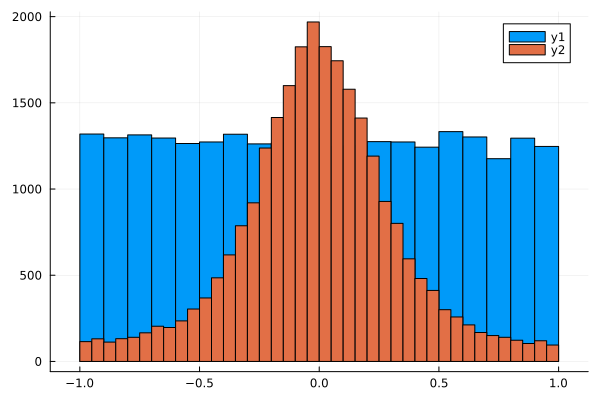

In [45]:
histogram(y2 |> vec)
histogram!(y |> vec)

In [46]:
sa = default_spk_args()

Neuron parameters: Period 1.0 (s)
Current kernel duration: 0.03 (s)
Threshold: 0.02 (V)


In [47]:
sa = SpikingArgs(2*pi, -0.2, 1.0, 0.03, 0.02, 0.005)

Neuron parameters: Period 1.0 (s)
Current kernel duration: 0.03 (s)
Threshold: 0.02 (V)


In [48]:
xt = phase_to_train(x, sa, repeats = 10)

Spike Train: (100, 1024) with 1024000 spikes.

In [49]:
call = SpikingCall(xt, sa, (0.0, 20.0))

SpikingCall(Spike Train: (100, 1024) with 1024000 spikes., Neuron parameters: Period 1.0 (s)
Current kernel duration: 0.03 (s)
Threshold: 0.02 (V)
, (0.0, 20.0))

In [50]:
y_sol = model2[1](call, return_solution=true)

retcode: Success
Interpolation: 3rd order Hermite
t: 4001-element Vector{Float64}:
  0.0
  0.005
  0.01
  0.015
  0.02
  0.025
  0.030000000000000002
  0.035
  0.04
  0.045
  0.049999999999999996
  0.05499999999999999
  0.05999999999999999
  ⋮
 19.945000000000316
 19.950000000000315
 19.955000000000314
 19.960000000000313
 19.965000000000312
 19.97000000000031
 19.97500000000031
 19.98000000000031
 19.98500000000031
 19.990000000000308
 19.995000000000307
 20.0
u: 4001-element Vector{Matrix{ComplexF32}}:
 [0.0f0 + 0.0f0im 0.0f0 + 0.0f0im … 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im; 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im … 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im; … ; 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im … 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im; 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im … 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im]
 [0.0017679154f0 + 2.8463168f-5im -0.0018369255f0 - 2.6623928f-5im … -0.0009434109f0 - 9.380926f-6im -0.00072364876f0 - 1.1025145f-5im; -0.00077687955f0 - 7.373261f-6im -0.0011699919f0 - 1.5958369f-5im … 0.0002402734

In [51]:
y_spikes = find_spikes_rf(y_sol, call.spk_args)

(CartesianIndex{2}[CartesianIndex(1, 1), CartesianIndex(1, 1), CartesianIndex(1, 1), CartesianIndex(1, 1), CartesianIndex(1, 1), CartesianIndex(1, 1), CartesianIndex(1, 1), CartesianIndex(1, 1), CartesianIndex(1, 1), CartesianIndex(1, 1)  …  CartesianIndex(100, 256), CartesianIndex(100, 256), CartesianIndex(100, 256), CartesianIndex(100, 256), CartesianIndex(100, 256), CartesianIndex(100, 256), CartesianIndex(100, 256), CartesianIndex(100, 256), CartesianIndex(100, 256), CartesianIndex(100, 256)], [0.19000000000000009, 1.1149999999999982, 2.0899999999999777, 3.0849999999999564, 4.079999999999935, 5.074999999999914, 6.074999999999893, 7.074999999999871, 8.069999999999862, 9.070000000000018  …  10.150000000000187, 11.150000000000343, 12.1500000000005, 13.150000000000656, 14.150000000000812, 15.150000000000968, 16.15000000000107, 17.150000000000873, 18.150000000000674, 19.150000000000475])

In [52]:
y_call = SpikingCall(SpikeTrain(y_spikes[1], y_spikes[2], size(y_sol.u[1]), 0.25), sa, (0.0, 20.0))

SpikingCall(Spike Train: (100, 256) with 494029 spikes., Neuron parameters: Period 1.0 (s)
Current kernel duration: 0.03 (s)
Threshold: 0.02 (V)
, (0.0, 20.0))

In [53]:
y_sol.u[1] |> size

(100, 256)

In [54]:
function get_us(sol, idx)
    return mapreduce(x->getindex(x, idx), vcat, sol.u);
end

get_us (generic function with 1 method)

In [55]:
function get_tms_us(x, sol, u, index)
    inds = map(x-> x == index, x[1])
    tms = x[2][inds]
    u_inds = findall(vec(sum(sol.t .== tms', dims=2) .> 0))
    us = u[u_inds]
    return (tms, us)
end

get_tms_us (generic function with 1 method)

In [56]:
function generate_plot(sol, spikes, idx)
    u = get_us(sol, idx)
    tms, peaks = get_tms_us(spikes, sol, u, idx)

    fig = plot(sol.t, real.(u))
    plot!(sol.t, imag.(u))
    scatter!(tms, imag.(peaks))
    return fig
end

generate_plot (generic function with 1 method)

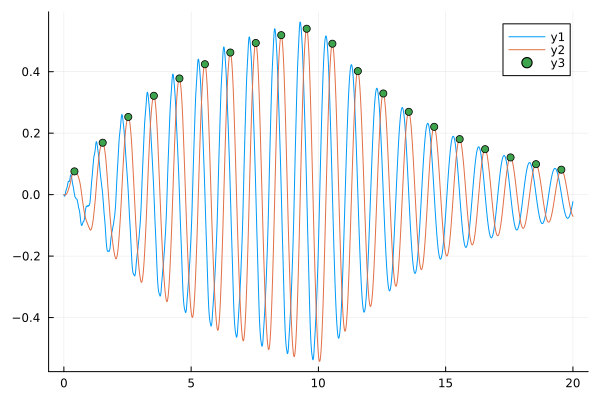

In [57]:
generate_plot(y_sol, y_spikes, CartesianIndex(100,1))

In [58]:
n1_u = get_us(y_sol, CartesianIndex(1,1))
n1_tms, n1_peaks = get_tms_us(y_spikes, y_sol, n1_u, CartesianIndex(1,1))

([0.19000000000000009, 1.1149999999999982, 2.0899999999999777, 3.0849999999999564, 4.079999999999935, 5.074999999999914, 6.074999999999893, 7.074999999999871, 8.069999999999862, 9.070000000000018, 10.050000000000171, 11.050000000000328, 12.050000000000484, 13.05000000000064, 14.050000000000797, 15.050000000000953, 16.05000000000109, 17.050000000000892, 18.050000000000693, 19.050000000000495], ComplexF32[0.0005521624f0 + 0.022136208f0im, 0.0019428184f0 + 0.082743056f0im, 0.0053284783f0 + 0.1388026f0im, 0.0026215448f0 + 0.18571945f0im, 0.003528098f0 + 0.22444656f0im, 0.0064481073f0 + 0.25631496f0im, 0.003406336f0 + 0.28240237f0im, 0.0008941105f0 + 0.30375674f0im, 0.007494343f0 + 0.32145497f0im, 0.0062301545f0 + 0.33582464f0im, 0.009614986f0 + 0.33987975f0im, 0.007583902f0 + 0.2782573f0im, 0.005973269f0 + 0.22780709f0im, 0.0046974667f0 + 0.18650365f0im, 0.0036879538f0 + 0.15268883f0im, 0.0028900804f0 + 0.12500481f0im, 0.0022602815f0 + 0.102340065f0im, 0.0017638399f0 + 0.083784625f0im, 0.0

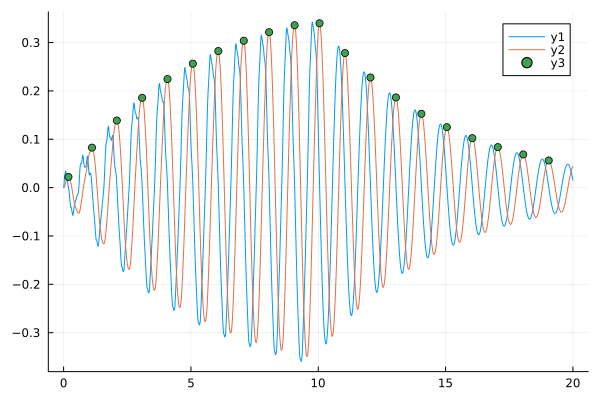

In [59]:
plot(y_sol.t, real.(n1_u))
plot!(y_sol.t, imag.(n1_u))
scatter!(n1_tms, imag.(n1_peaks))

In [60]:
CartesianIndex(1,1)

CartesianIndex(1, 1)

In [61]:
n2_u = mapreduce(x->getindex(x, CartesianIndex(1,2)), vcat, y_sol.u);

In [62]:
n2_tms, n2_peaks = get_tms_us(y_spikes, y_sol, n2_u, CartesianIndex(1,2))

([0.8900000000000007, 1.8899999999999817, 2.8949999999999605, 3.894999999999939, 4.894999999999918, 5.8949999999998965, 6.894999999999875, 7.894999999999854, 8.89499999999999, 9.895000000000147, 10.900000000000304, 11.90000000000046, 12.895000000000616, 13.895000000000772, 14.895000000000929, 15.895000000001085, 16.895000000000923, 17.895000000000724, 18.895000000000525, 19.895000000000326], ComplexF32[0.0013353871f0 + 0.08041379f0im, 0.0049567414f0 + 0.14444435f0im, 0.0011282957f0 + 0.19681035f0im, 0.0021161637f0 + 0.2397392f0im, 0.0028886257f0 + 0.27488455f0im, 0.0034913332f0 + 0.30365783f0im, 0.00396037f0 + 0.3272141f0im, 0.004324458f0 + 0.34649915f0im, 0.0046061366f0 + 0.3622876f0im, 0.0048234016f0 + 0.3752133f0im, 0.000611413f0 + 0.3030365f0im, 0.00024424255f0 + 0.2480872f0im, 0.0063771163f0 + 0.20320489f0im, 0.0050488557f0 + 0.16636302f0im, 0.003992637f0 + 0.13620055f0im, 0.0031534946f0 + 0.11150657f0im, 0.002487348f0 + 0.09128966f0im, 0.0019590978f0 + 0.074738175f0im, 0.00154063

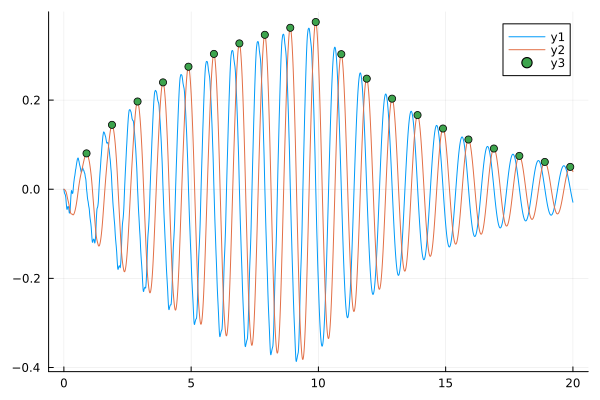

In [63]:
plot(y_sol.t, real.(n2_u))
plot!(y_sol.t, imag.(n2_u))
scatter!(n2_tms, imag.(n2_peaks))

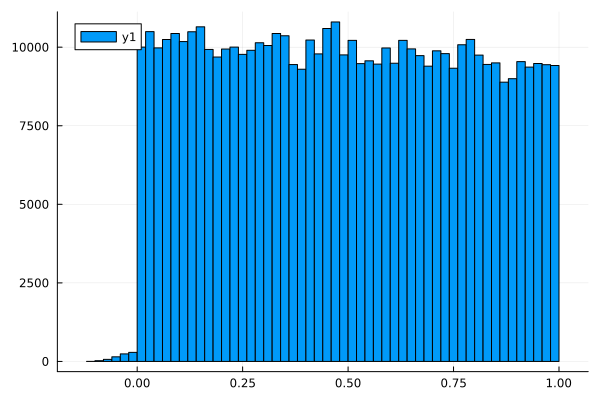

In [64]:
histogram((y_call.train.times .- y_call.train.offset) .% 1.0)


In [65]:
y_sphase = train_to_phase(y_call)

20×100×256 Array{Float64, 3}:
[:, :, 1] =
 0.88   -0.15  NaN     0.17  NaN     …  NaN      0.08  0.35   -0.06  -0.67
 0.73   -0.16    0.21  0.14    1.0        0.97   0.02  0.31    0.21  -0.45
 0.68   -0.16    0.14  0.13    1.0        0.98  -0.01  0.29    0.21  -0.44
 0.67   -0.16    0.13  0.13    1.0        0.98  -0.02  0.28    0.21  -0.43
 0.66   -0.16    0.12  0.13    1.0        0.98  -0.03  0.28    0.21  -0.42
 0.65   -0.16    0.09  0.12    1.0   …    0.98  -0.04  0.27    0.2   -0.42
 0.65   -0.16    0.08  0.12    1.0        0.98  -0.05  0.27    0.2   -0.42
 0.65   -0.16    0.08  0.12    1.0        0.98  -0.05  0.27    0.2   -0.42
 0.64   -0.16    0.08  0.12    1.0        0.98  -0.05  0.27    0.2   -0.42
 0.64   -0.16    0.08  0.12   -1.0        0.98  -0.06  0.27    0.2   -0.42
 0.6    -0.17    0.07  0.1    -1.0   …    0.98  -0.11  0.25    0.19  -0.4
 0.6    -0.17    0.07  0.1    -1.0        0.98  -0.11  0.25    0.19  -0.4
 0.6    -0.17    0.07  0.1    -1.0        0.98  -0.11  0.25 

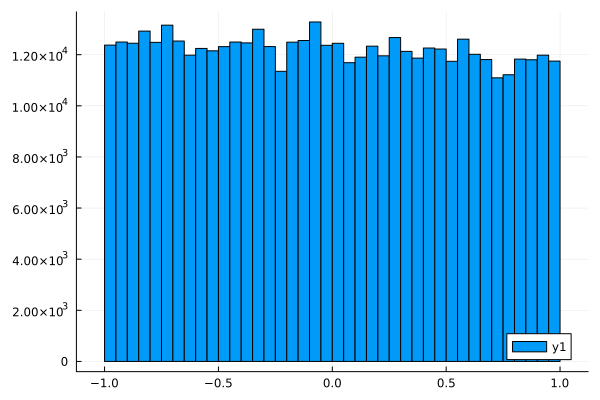

In [66]:
histogram(y_sphase |> vec)

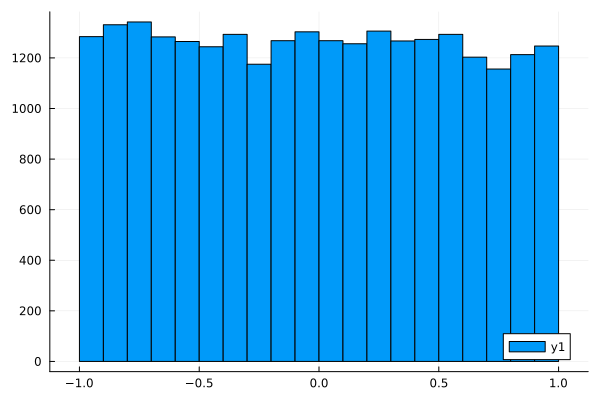

In [67]:
histogram(y_sphase[4,:,:] |> vec, bins=-1.0:0.1:1.0)

In [68]:
cyc4_err = vec(y) - vec(y_sphase[4,:,:])

25600-element Vector{Float64}:
 -0.2925529043853835
  0.12086468018781181
 -0.10971036306085057
 -0.06546594268358037
 -1.9846692265544283
 -0.04634813615213379
  0.8085368402280655
 -0.4698365487662492
 -0.03941242636562955
 -0.09670253928030212
  0.2171322235319083
  0.26463997272265244
  0.09302207174755983
  ⋮
  0.04241361330786107
 -0.22331877143000423
 -0.12189939640095215
 -0.10082246552776536
  0.4030626713045282
 -0.4363234282997831
  0.3417904808472088
 -0.0843275527408395
  0.04775722383724805
  0.35399621931964975
  0.038671577783642275
 -0.2354369208601178

In [74]:
findall(cyc4_err .> 0.9)

303-element Vector{Int64}:
   168
   188
   304
   436
   520
   598
   614
   620
   624
   630
   688
   712
   896
     ⋮
 24316
 24361
 24434
 24673
 24709
 24778
 24877
 25143
 25278
 25326
 25339
 25366

In [80]:
y_sphase[4,1,168]

-0.45000000000010587

In [ ]:
y[168]

-0.07440986801747107

In [ ]:
y_sphase[168]

0.06999999999971251

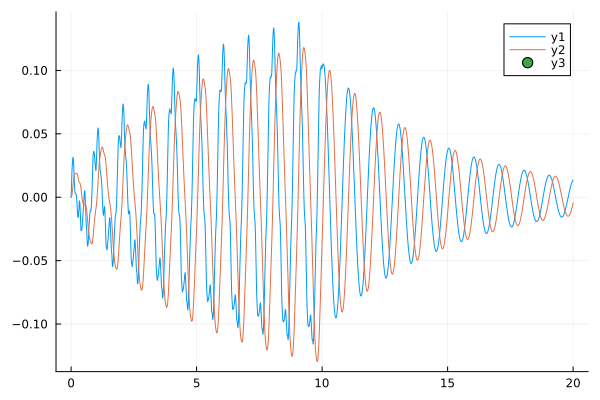

In [ ]:
generate_plot(y_sol, y_spikes, 168)

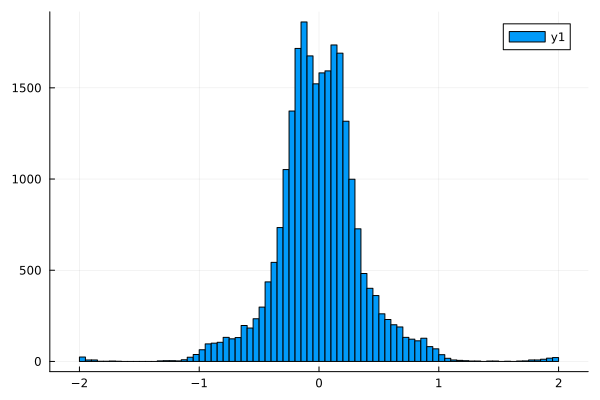

In [69]:
histogram(cyc4_err)

In [70]:
scatter(vec(y), vec(y_sphase[4,:,:]), alpha=0.02)

In [71]:
scatter(vec(y), vec(y_sphase[19,:,:]), alpha=0.03)

In [36]:
n_zeros = mapslices(x->sum(isnan.(x)), y_sphase, dims=(2,3)) |> vec

20-element Vector{Int64}:
 7991
 1242
  534
  338
  245
  202
  169
  142
  251
  153
  157
  180
  262
  395
  598
  891
 1344
 1962
 2883
 4184

In [37]:
cv = cycle_correlation(y, y_sphase)

20-element Vector{Float64}:
 0.3954394113469069
 0.7413311152970664
 0.8017255021086277
 0.8207288067694646
 0.8300542527408854
 0.8382707956840753
 0.8424613199415608
 0.8446237835024355
 0.844930461264187
 0.8440675186979997
 0.8550143226212864
 0.855818143029444
 0.8567683367124533
 0.8585477633765435
 0.8609745311983478
 0.8641240317085765
 0.8692131609194955
 0.8759401652563519
 0.884969047824877
 0.8976402245489147

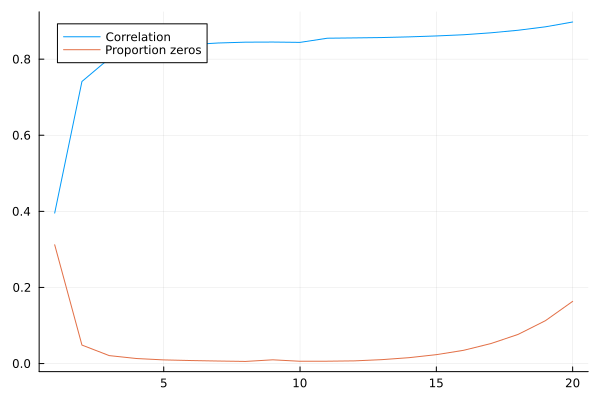

In [38]:
plot(cv, label="Correlation")
plot!(n_zeros / prod(size(y_sphase[1,:,:])), label="Proportion zeros")